# Imports

In [4]:
%load_ext autoreload
%autoreload 2
%aimport mc.util 
from util import *
%matplotlib widget

import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import scipy
import os
import pyximport; pyximport.install()

plt.style.use('ggplot')
matplotlib.rcParams["mathtext.fontset"] = "cm"

os.environ['CC'] = 'clang'
os.environ['CXX'] = 'clang -shared'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
from scipy.interpolate import splrep, splev, BSpline

def rescale(t, y, L, tc, nu, k_over_nu, a, omega, b, phi):
    xs = (t-tc)/tc * L**(1/nu) + b * L**(-phi)
    ys = y * L**(-k_over_nu) * (1 + a * L**(-omega))**(-1.)
    return xs, ys

def collapse(curves, ax, bounds, yvar_name, exponent_name):
    colors = gen_colors(curves)

    p = None
    boundmin = None
    boundmax = None
    def fun(x, curves, deg):
        nonlocal p, boundmin, boundmax
        tc, nu, k_over_nu, a, omega, b, phi = x
        boundmin = -np.inf
        boundmax = np.inf
        xmin = np.inf
        xmax = -np.inf
        all_xs, all_ys = [], []
        for L, t, y in curves:
            st, sy = rescale(t, y, L, tc, nu, k_over_nu, a, omega, b, phi)
            all_xs = np.concatenate((all_xs, st))
            all_ys = np.concatenate((all_ys, sy))
            boundmin = max(boundmin, np.amin(st))
            boundmax = min(boundmax, np.amax(st))
            xmin = min(xmin, np.amin(st))
            xmax = max(xmax, np.amax(st))

        indices = (all_xs>=boundmin)*(all_xs<=boundmax)
        all_xs, all_ys = all_xs[indices], all_ys[indices]

        p = np.polyfit(all_xs, all_ys, deg)
        chisq = np.sum((np.polyval(p, all_xs) - all_ys)**2/np.std(all_ys)**2) * ((xmax - xmin)/(boundmax-boundmin))
        return chisq

    for L, t, y in curves:
        ax[0].plot(t, y, color=colors[L], label=L)

    p0 = []
    pbounds = []
    for prop in ["tc", "nu", "k_over_nu", "a", "omega", "b", "phi"]:
        if isinstance(bounds[prop], tuple):
            pbounds.append(bounds[prop])
            p0.append((bounds[prop][0] + bounds[prop][1])/2)
        else:
            pbounds.append((bounds[prop], bounds[prop]))
            p0.append(bounds[prop])

    res = scipy.optimize.minimize(fun, p0, bounds=pbounds, args=(curves, 6))
    tc, nu, k_over_nu, a, omega, b, phi = res.x

    allx, ally = np.array([]), np.array([])
    for L, t, y in curves:
        st, sy = rescale(t, y, L, tc, nu, k_over_nu, a, omega, b, phi)
        allx = np.concatenate((allx, st))
        ally = np.concatenate((ally, sy))
        ax[1].plot(st, sy, color=colors[L], label=L)

    xs = np.linspace(boundmin, boundmax, 100)
    yrange = np.amax(ally) - np.amin(ally)
    ax[1].set_ylim([np.amin(ally)-yrange*0.05, np.amax(ally)+yrange*0.05])
    # ax[1].plot(xs, np.polyval(p, xs))

    ax[0].set_ylabel(f"${yvar_name}$")
    ax[0].set_xlabel("$T$")
    if exponent_name is None:
        ax[1].set_title(f"$T_c={tc:.3f}, \\nu={nu:.2f}$")
        ax[1].set_ylabel(f"${yvar_name}$")
    else:
        ax[1].set_title(f"$T_c={tc:.3f}, \\nu={nu:.2f}, {exponent_name}={k_over_nu*nu:.2f}$")
        ax[1].set_ylabel(f"${yvar_name} L^{{-{exponent_name}/\\nu}}$")
    ax[1].set_xlabel("$(T-T_c)L^{-\\nu}/T_c$")
    print(res.x)


def plot_all_collapse(energy_curves, corr_curves, order_curves, sus_curves, energy_binder_curves, binder_curves, tc_range, nu_range, alpha_range=(0.5, 1.5)):
    plt.close("all")
    fig, ax = plt.subplots(2, 5, figsize=[14,7])

    a_range = 0
    omega_range = 0
    b_range = 0
    phi_range = 0


    collapse(energy_curves, ax[:, 0], {
        "tc": tc_range,
        "nu": nu_range,
        "k_over_nu": alpha_range,
        "a": a_range,
        "omega": omega_range,
        "b": b_range,
        "phi": phi_range
    }, "(C_v/N)", "\\alpha")

    if corr_curves is not None:
        collapse(corr_curves, ax[:, 1], {
            "tc": tc_range,
            "nu": nu_range,
            "k_over_nu": 0,
            "a": a_range,
            "omega": omega_range,
            "b": b_range,
            "phi": phi_range
        }, "(\\xi_a/L)", None)

    collapse(order_curves, ax[:, 2], {
        "tc": tc_range,
        "nu": nu_range,
        "k_over_nu": (-1, 2),
        "a": a_range,
        "omega": omega_range,
        "b": b_range,
        "phi": phi_range
    }, "S(q=K)", "\\beta")

    collapse(sus_curves, ax[:, 3], {
        "tc": tc_range,
        "nu": nu_range,
        "k_over_nu": (-2, 2),
        "a": a_range,
        "omega": omega_range,
        "b": b_range,
        "phi": phi_range
    }, "\chi", "\\gamma")

    ax[0, 0].set_title("Critical heat and collapse")
    ax[0, 1].set_title("Correlation length and collapse")
    ax[0, 2].set_title("Order parameter and collapse")
    ax[0, 3].set_title("Susceptibility and collapse")

    colors = gen_colors(energy_binder_curves)
    for L, t, y in energy_binder_curves:
        ax[0, 4].plot(t, y, color=colors[L])
    ax[0, 4].set_title("Energy cumulant")
    ax[0, 4].set_xlabel("$T$")
    ax[0, 4].set_ylabel("$1-\\langle E^4 \\rangle/3\\langle E^2\\rangle^2$")

    colors = gen_colors(binder_curves)
    for L, t, y in binder_curves:
        ax[1, 4].plot(t, y, color=colors[L])
    ax[1, 4].set_title("Order parameter cumulant")
    ax[1, 4].set_ylabel("$1-\\langle S(q=K)^4 \\rangle/2\\langle S(q=K)^2\\rangle^2$")
    ax[1, 4].set_xlabel("$T$")

    fig.tight_layout()

In [6]:
import collections
import json
Props = collections.namedtuple("Props", "e cv b_e k chi_k b_k s chi_s b_s")

def get_all_moments(glob, pkl):
    import pickle
    if os.path.exists(pkl):
        with open(pkl, "rb") as f:
            return pickle.load(f)
    data = []
    for f in enum_files(glob):
        e, k, sl = read_histogram(f["fname"], skip=10000)
        em, cem = calculate_moments(e)
        km, ckm = calculate_moments(k)
        sm, csm = calculate_moments(np.abs(sl))
        data.append((f, em, cem, km, ckm, sm, csm))
    with open(pkl, "wb") as f:
        pickle.dump(data, f)
    return data

def curves_from_moments(data):
    lens = sorted(set(x[0]["l"] for x in data))
    curves = []
    for l in lens:
        ts, e, cv, e4, k, kchi, k4, s, schi, s4 = tuple([] for i in range(10))
        for d in sorted((d for d in data if d[0]["l"] == l), key=lambda x: x[0]["t"]):
            prop, em, cem, km, ckm, sm, csm = d
            n = prop["l"]**2/3 - prop["r"]/3
            t = prop["t"]
            ts.append(t)
            e.append(em[1]/n)
            cv.append(cem[2]/t**2/n)
            e4.append(1-em[4]/3/em[2]**2)
            k.append(km[1]/n)
            kchi.append(ckm[2]/t/n)
            k4.append(1-km[4]/2/km[2]**2)
            s.append(sm[1]/n)
            schi.append(csm[2]/t/n)
            s4.append(1-sm[4]/3/sm[2]**2)
        curves.append((l, np.array(ts), Props(*tuple(np.array(x) for x in [e, cv, e4, k, kchi, k4, s, schi, s4]))))
    return curves

def curves_from_jsons(fmt, lens):
    curves = []
    for l in lens:
        with open(fmt.format(l), "r") as f:
            data = json.load(f)
            curves.append((l, np.array(data["t"]), Props(*tuple(np.array(data[x]) if x in data else None for x in ["e", "cv", "b_e", "k", "chi_k", "b_k", "s", "chi_s", "b_s"]))))
    return curves

def pick_curve(curves, name, bounds=None):
    if bounds is None:
        return [(l, t, p._asdict()[name]) for l, t, p in curves]
    else:
        lb, ub = bounds
        return [(l, t[(lb<t)*(t<ub)], p._asdict()[name][(lb<t)*(t<ub)]) for l, t, p in curves]

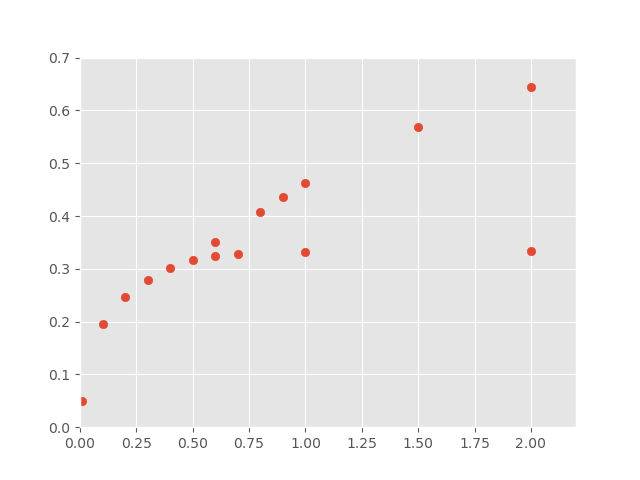

In [70]:
points = []
points.append((0.01, 0.05))
points.append((0.1, 0.196))
points.append((0.2, 0.247))
points.append((0.3, 0.279))
points.append((0.4, 0.302))
points.append((0.5, 0.317))
points.append((0.6, 0.324))
points.append((0.7, 0.328))
points.append((1, 0.332))
points.append((2, 0.334))

points.append((0.6, 0.350))
points.append((0.8, 0.4082))
points.append((0.9, 0.4362))
points.append((1, 0.463))
points.append((1.5, 0.568))
points.append((2, 0.644))

plt.figure()
plt.xlim([0, 2.2])
plt.ylim([0, 0.7])
plt.scatter(np.array(points).T[0], np.array(points).T[1])

## Weak transitions

### J=0.1

[ 1.95991186e-01  5.50440723e-01  8.07051576e-01 -8.67463901e-09
  0.00000000e+00]
[1.95989818e-01 5.50509963e-01 0.00000000e+00 6.59948508e-11
 0.00000000e+00]
[ 1.95663172e-01  5.66024438e-01  1.92954453e-02  4.89185679e-07
 -9.02774828e-14]
[ 1.95825080e-01  6.00000000e-01  2.00000000e+00 -3.10722344e-07
 -6.54520579e-11]


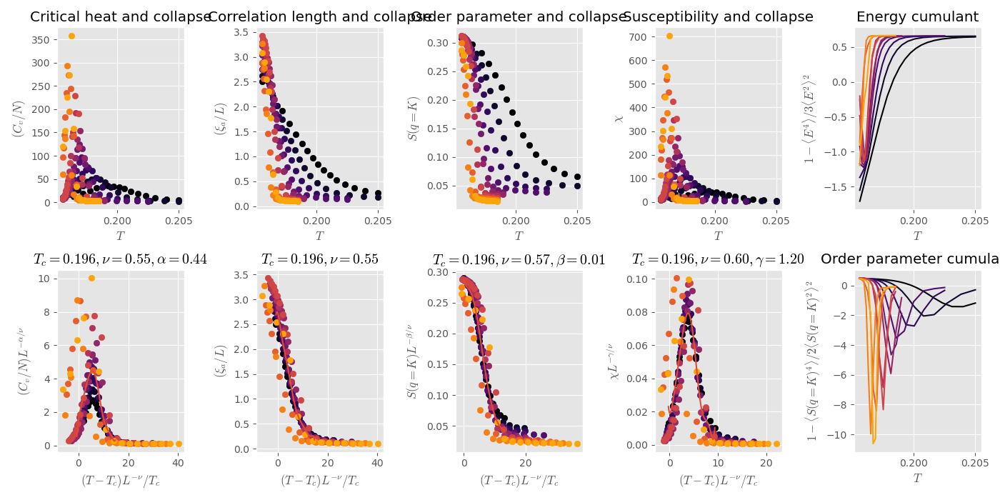

No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b
No such comm: 56b7bc9aa092450eb0a6da195b037d6b


In [19]:
plot_all_collapse(
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.1b/*/energy.dat"])],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.1b/*/order.dat"], prop="corr")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.1b/*/order.dat"], prop="k")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.1b/*/order.dat"], prop="ksus")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.1b/*/energy.dat"], prop="eb")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.1b/*/order.dat"], prop="kb")],
    (0.195, 0.197),
    (0.5, 0.6)
)

### J=0.2

[ 2.46729949e-01  5.46453367e-01  1.53800195e+00  1.79888957e-02
 -4.05604602e-05]
[ 2.46774313e-01  5.43858660e-01  0.00000000e+00  1.97137904e-06
 -4.60907596e-12]
[ 2.46731127e-01  5.30104780e-01 -9.66438027e-02  2.24609044e-04
 -8.43261047e-11]
[ 0.246       0.6         1.69000499 -0.25260065 -0.09634289]


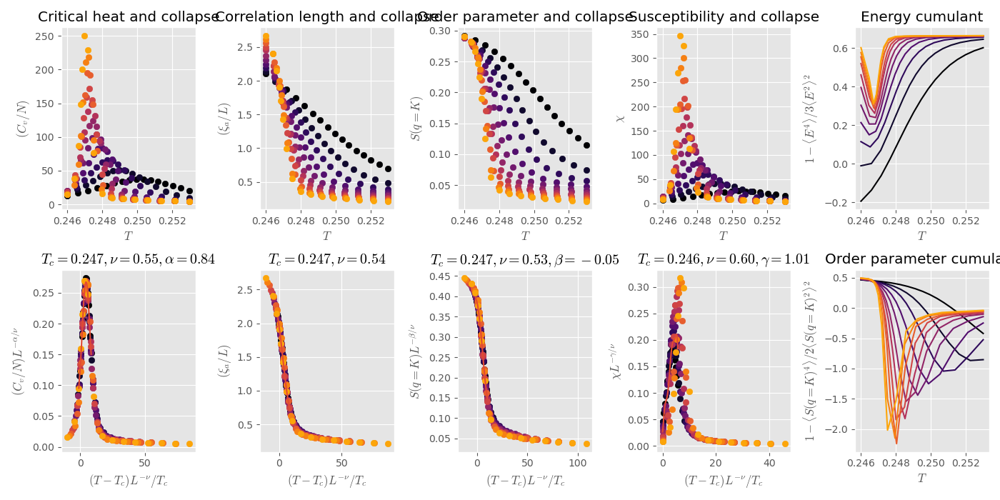

In [18]:
skip=50000
plot_all_collapse(
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.2d/*/energy.dat"])],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.2d/*/order.dat"], prop="corr")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.2d/*/order.dat"], prop="k")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.2d/*/order.dat"], prop="ksus")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.2f/*/energy.dat"], prop="eb")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.2d/*/order.dat"], prop="kb")],
    (0.246, 0.247),
    (0.5, 0.6)
)

### J=0.3

[0.27925504 0.56699267 1.2932224  0.         0.         0.
 0.        ]
[0.27911251 0.6        0.         0.         0.         0.
 0.        ]
[ 0.27927516  0.52345968 -0.11829867  0.          0.          0.
  0.        ]
[0.27927618 0.52802077 2.         0.         0.         0.
 0.        ]


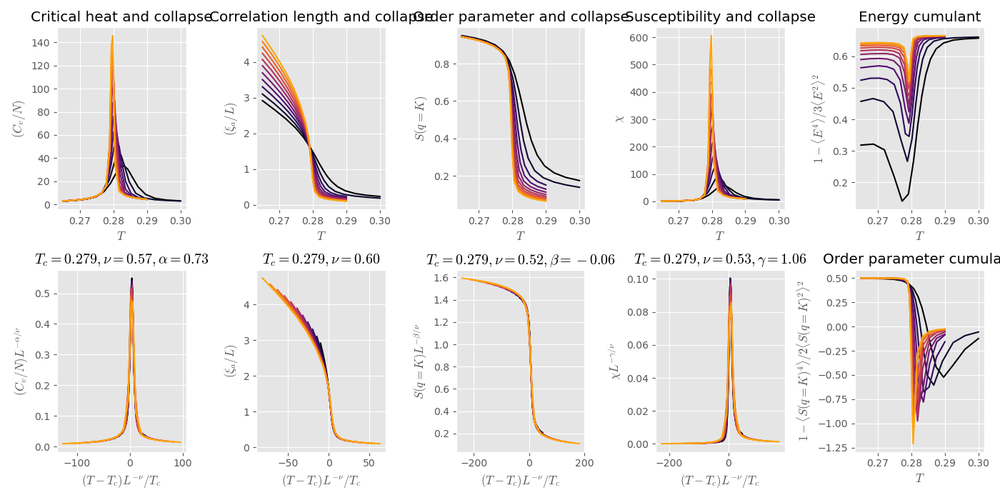

In [11]:
skip=50000
plot_all_collapse(
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.3c/*/energy.dat"])],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.3c/*/order.dat"], prop="corr")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.3c/*/order.dat"], prop="k")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.3c/*/order.dat"], prop="ksus")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.3c/*/energy.dat"], prop="eb")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.3c/*/order.dat"], prop="kb")],
    (0.279, 0.28),
    (0.5, 0.6)
)

### J=0.4

[0.30241045 0.64937621 0.98153332 0.         0.         0.
 0.        ]
[0.30207089 0.8        0.         0.         0.         0.
 0.        ]
[ 0.3023671   0.64582114 -0.14348849  0.          0.          0.
  0.        ]
[0.30235006 0.67513365 1.7502082  0.         0.         0.
 0.        ]


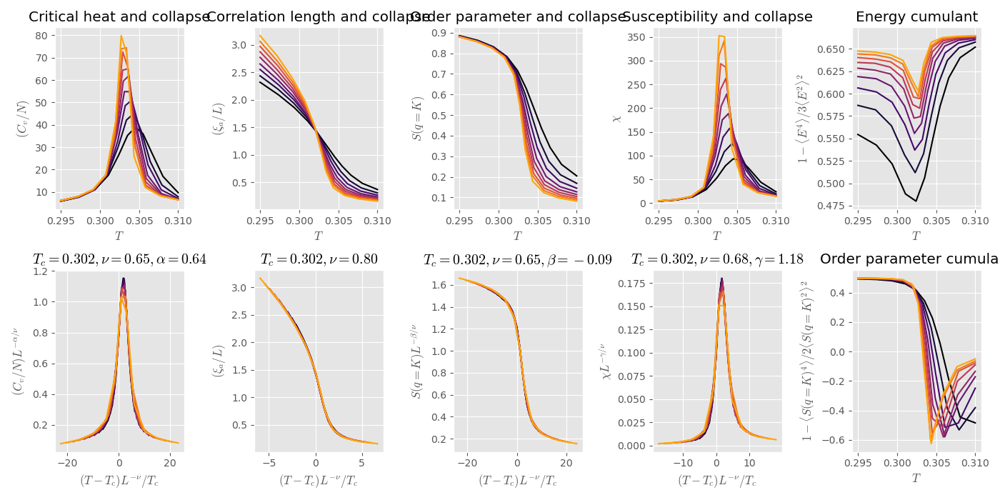

In [4]:
skip=50000
plot_all_collapse(
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.4/*/energy.dat"])],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.4/*/order.dat"], prop="corr")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.4/*/order.dat"], prop="k")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.4/*/order.dat"], prop="ksus")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.4/*/energy.dat"], prop="eb")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.4/*/order.dat"], prop="kb")],
    (0.300, 0.305),
    (0.5, 0.8)
)

## Continuous transitions

[0.3168    0.9223156 0.5       0.        0.        0.        0.       ]
[0.3168     0.97756572 0.         0.         0.         0.
 0.        ]
[ 0.3168     0.9311044 -0.1064718  0.         0.         0.
  0.       ]
[0.3168     0.9835619  1.56809027 0.         0.         0.
 0.        ]


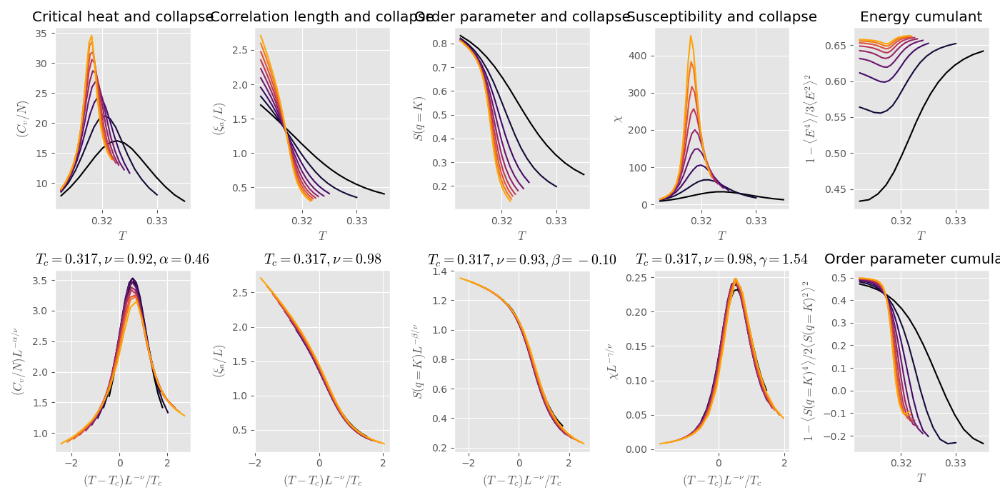

In [ ]:
skip=0
plot_all_collapse(
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.5c/*/energy.dat"])],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.5c/*/order.dat"], prop="corr")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.5c/*/order.dat"], prop="k")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.5c/*/order.dat"], prop="ksus")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.5c/*/energy.dat"], prop="eb")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.5c/*/order.dat"], prop="kb")],
    (0.3167, 0.3168),
    (0.6, 1.2)
)

[0.31666075 1.0093898  0.4378765  0.         0.         0.
 0.        ]
[ 0.31735706  0.85226904 -0.16481116  0.          0.          0.
  0.        ]
[0.31712079 0.88869925 1.61150687 0.         0.         0.
 0.        ]


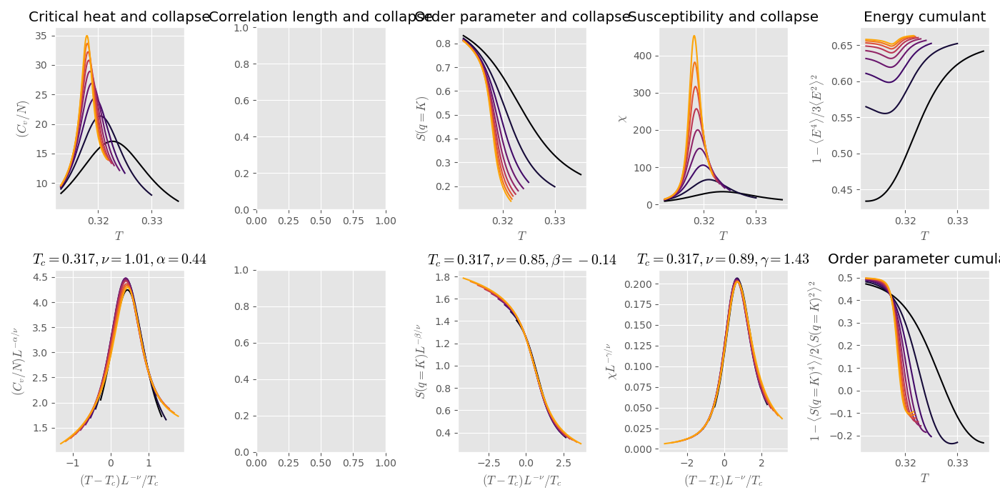

In [8]:
curves = curves_from_jsons("new-data/mhr/{}_0.5c.json", range(24, 120+1, 12))

plot_all_collapse(
    pick_curve(curves, "cv", bounds=(0.313, 0.4)),
    None,
    pick_curve(curves, "k"),
    pick_curve(curves, "chi_k"),
    pick_curve(curves, "b_e"),
    pick_curve(curves, "b_k"),
    (0.316, 0.318),
    (0.5, 1.5),
    alpha_range=(0, 0.8)
)

[0.3245 0.7    1.     0.     0.     0.     0.    ]
[0.3245 0.7    0.5    0.     0.     0.     0.    ]
[0.3245 0.7    0.     0.     0.     0.     0.    ]


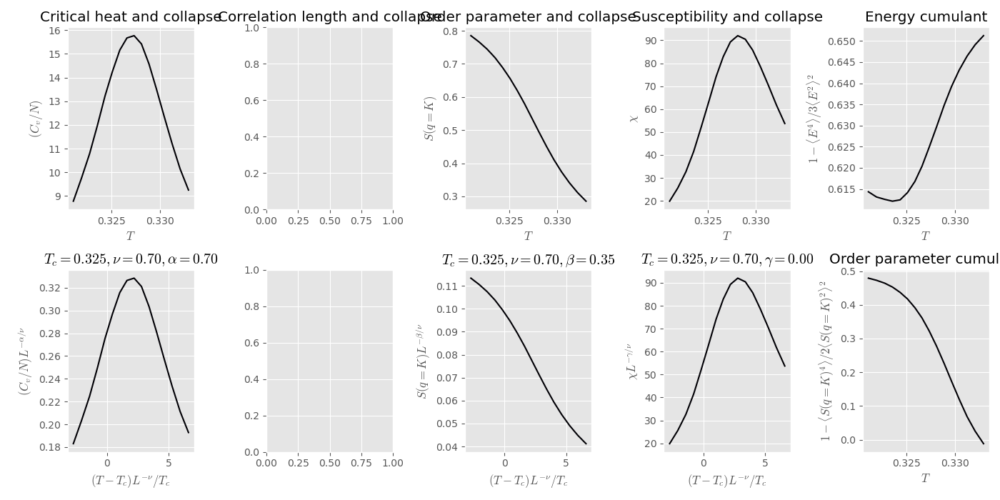

In [10]:
skip=0
plot_all_collapse(
    [c for c in get_all_curves(["new-data/temp/0.6-0.75/*/energy.dat"], skip=skip)],
    None,
    [c for c in get_all_curves(["new-data/temp/0.6-0.75/*/order.dat"], prop="k", skip=skip)],
    [c for c in get_all_curves(["new-data/temp/0.6-0.75/*/order.dat"], prop="chi_k", skip=skip)],
    [c for c in get_all_curves(["new-data/temp/0.6-0.75/*/energy.dat"], prop="b_e", skip=skip)],
    [c for c in get_all_curves(["new-data/temp/0.6-0.75/*/order.dat"], prop="b_k", skip=skip)],
    (0.322, 0.327),
    (0.5, 0.9)
)

[0.32455912 0.80751158 0.5        0.         0.         0.
 0.        ]
[0.32451544 0.89354081 0.         0.         0.         0.
 0.        ]
[ 0.32483915  0.82296454 -0.1573114   0.          0.          0.
  0.        ]
[0.32462172 0.86391206 1.68852776 0.         0.         0.
 0.        ]


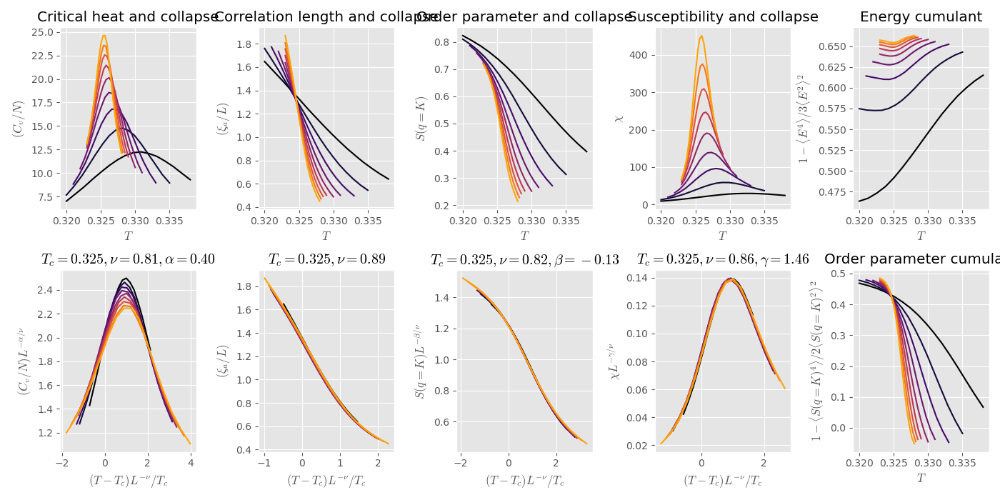

In [11]:
skip=100000
plot_all_collapse(
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.6c/*/energy.dat"], skip=skip)],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.6c/*/order.dat"], prop="corr", skip=skip)],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.6c/*/order.dat"], prop="k", skip=skip)],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.6c/*/order.dat"], prop="chi_k", skip=skip)],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.6c/*/energy.dat"], prop="b_e", skip=skip)],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.6c/*/order.dat"], prop="b_k", skip=skip)],
    (0.322, 0.327),
    (0.5, 0.9)
)

[0.32474    0.81876699 0.46796889 0.         0.         0.
 0.        ]
[ 0.32474     0.83653108 -0.1474971   0.          0.          0.
  0.        ]
[0.32474    0.83508448 1.70336551 0.         0.         0.
 0.        ]


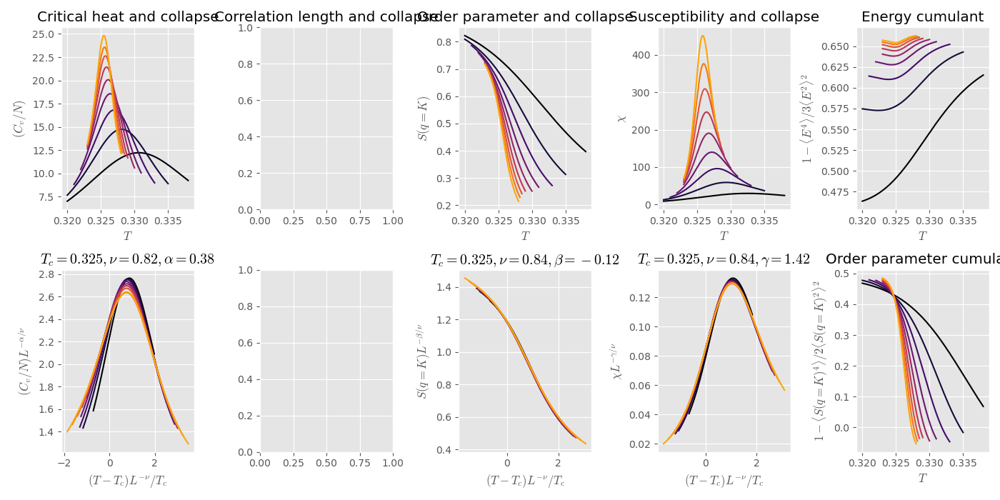

In [11]:
curves = curves_from_jsons("new-data/mhr/{}_0.6c.json", range(24, 120+1, 12))

plot_all_collapse(
    pick_curve(curves, "cv", bounds=(0.313, 0.4)),
    None,
    pick_curve(curves, "k"),
    pick_curve(curves, "chi_k"),
    pick_curve(curves, "b_e"),
    pick_curve(curves, "b_k"),
    0.32474,
    (0.5, 1.5),
    alpha_range=(0, 0.8)
)

[ 3.52914846e-01  1.50000000e+00  1.04631034e-01 -1.06315080e-06
  9.90335922e-08 -4.27655313e-07 -2.07484391e-08]
[ 3.51910941e-01  9.31980382e-01 -1.70807543e-01 -1.39374128e-08
  2.69136818e-12  1.26717508e-06 -6.51162341e-08]
[ 3.49638554e-01  1.05718265e+00  1.73246159e+00  2.17160672e-08
 -2.14104131e-07  7.33678248e-08 -3.03661314e-07]


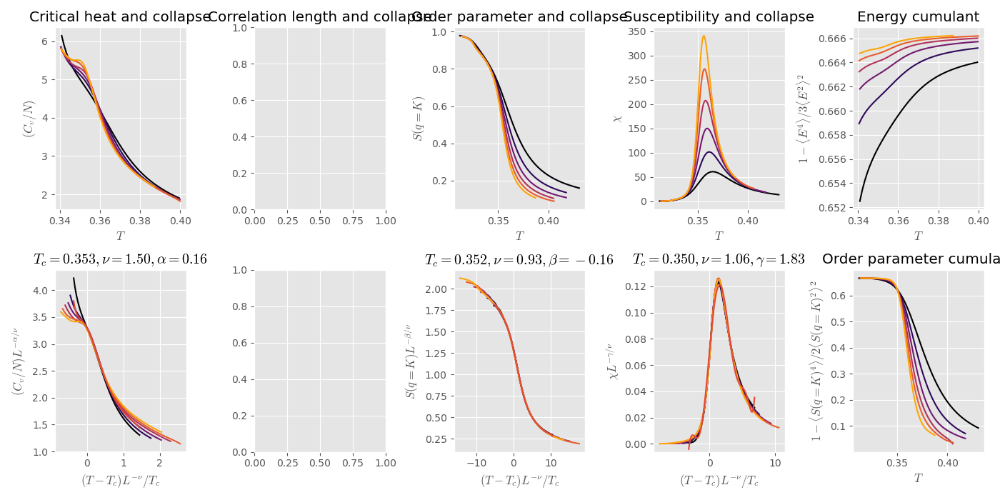

In [23]:
# curves = curves_from_moments(get_all_moments("new-data/vsweeps/binder-slp/0.6/*0.6*/histogram.dat", "new-data/binder-slp-0.6.pkl"))
curves = curves_from_jsons("new-data/mhr/{}_slp_0.6.json", range(36, 96+1, 12))

plot_all_collapse(
    pick_curve(curves, "cv", (0.34, 0.4)),
    None,
    pick_curve(curves, "s"),
    pick_curve(curves, "chi_s"),
    pick_curve(curves, "b_e", (0.34, 0.4)),
    pick_curve(curves, "b_s"),
    (0.349, 0.353),
    (0.5, 1.5),
    alpha_range=(0, 0.5),
)

[0.32825697 0.86909403 0.5        0.         0.         0.
 0.        ]
[0.32831181 0.89442963 0.         0.         0.         0.
 0.        ]
[ 0.32849565  0.83024957 -0.13423254  0.          0.          0.
  0.        ]
[0.32843573 0.85134282 1.71403507 0.         0.         0.
 0.        ]


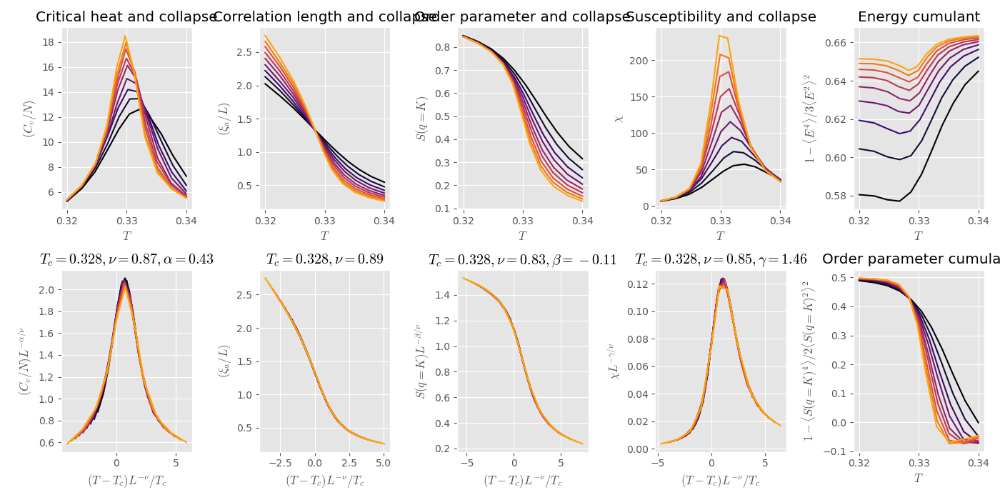

In [10]:
skip=50000
plot_all_collapse(
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.7/*/energy.dat"])],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.7/*/order.dat"], prop="corr")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.7/*/order.dat"], prop="k")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.7/*/order.dat"], prop="ksus")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.7/*/energy.dat"], prop="eb")],
    [c for c in get_all_curves(["new-data/vsweeps/binder/0.7/*/order.dat"], prop="kb")],
    (0.32, 0.33),
    (0.5, 0.9)
)

### J=0.8

[0.32450001 0.70000034 1.00000067 0.         0.         0.
 0.        ]
[0.3245 0.7    0.5    0.     0.     0.     0.    ]
[ 3.24501050e-01  6.99999317e-01 -1.79579033e-06  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00]


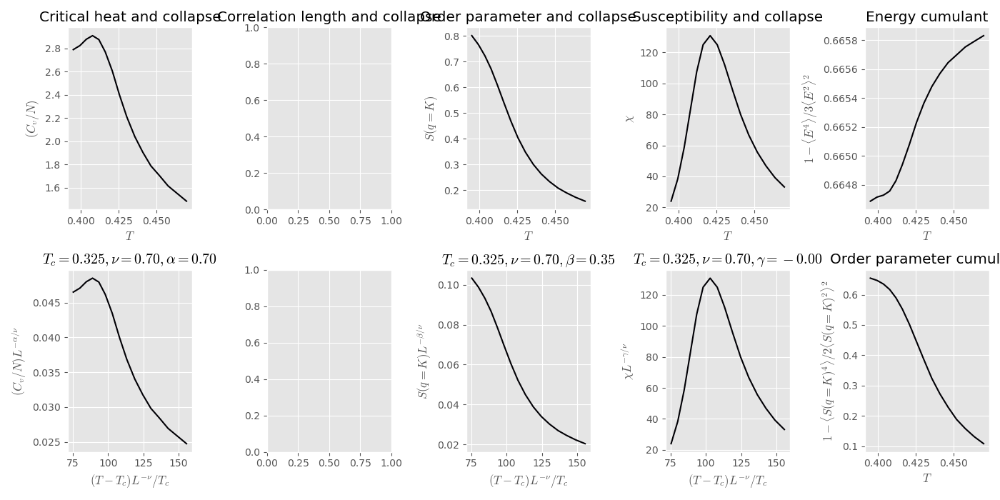

In [8]:
skip=0
plot_all_collapse(
    [c for c in get_all_curves(["new-data/temp/0.8-0.75/*/energy.dat"], skip=skip)],
    None,
    [c for c in get_all_curves(["new-data/temp/0.8-0.75/*/order.dat"], prop="s", skip=skip)],
    [c for c in get_all_curves(["new-data/temp/0.8-0.75/*/order.dat"], prop="ssus", skip=skip)],
    [c for c in get_all_curves(["new-data/temp/0.8-0.75/*/energy.dat"], prop="eb", skip=skip)],
    [c for c in get_all_curves(["new-data/temp/0.8-0.75/*/order.dat"], prop="sb", skip=skip)],
    (0.322, 0.327),
    (0.5, 0.9)
)

[0.4082 1.2    0.5    0.     0.     0.     0.    ]
[ 0.4082      1.0280093  -0.11069354  0.          0.          0.
  0.        ]
[ 0.4082      1.08247454 -0.23766627  0.          0.          0.
  0.        ]


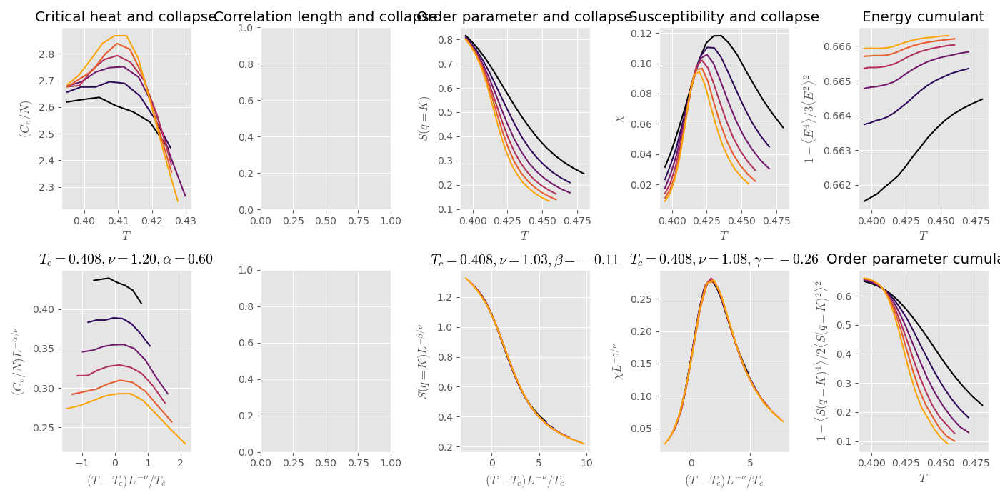

In [18]:
curves = curves_from_moments(get_all_moments("new-data/vsweeps/binder-slp/0.8/*/histogram.dat", "new-data/binder-slp-0.8.pkl"))

plot_all_collapse(
    pick_curve(curves, "cv", bounds=(0.3, 0.43)),
    None,
    pick_curve(curves, "s"),
    pick_curve(curves, "chi_s"),
    pick_curve(curves, "b_e"),
    pick_curve(curves, "b_s"),
    0.4082,
    (1, 1.2),
    alpha_range=(0, 0.5)
)

[ 4.36200000e-01  1.50000000e+00  1.11118661e-01  2.52451676e-04
 -2.38791879e-05]
[ 4.36200000e-01  1.03139001e+00 -1.17429382e-01  2.50780413e-05
  2.63933962e-06]
[ 4.36200000e-01  1.07988024e+00  1.77931884e+00  6.66849127e-05
 -3.54348577e-06]


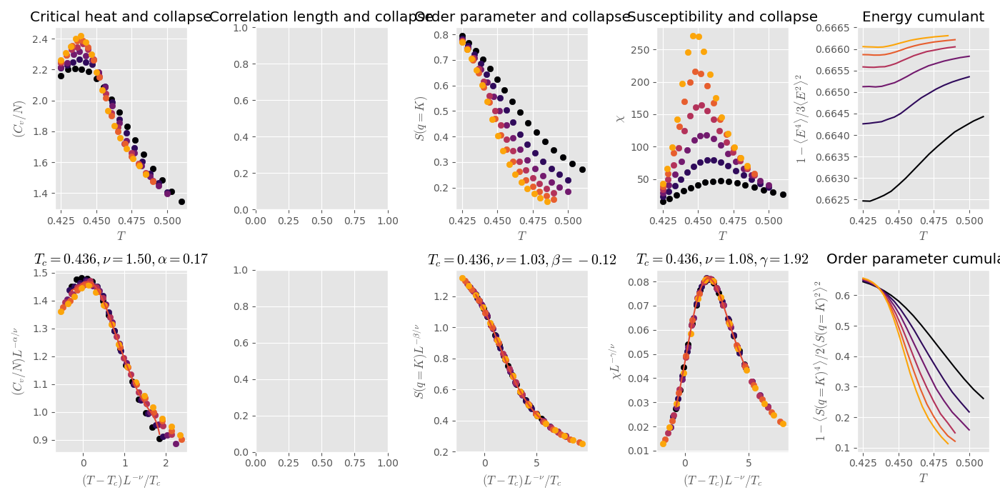

In [46]:
curves = curves_from_moments(get_all_moments("new-data/vsweeps/binder-slp/0.9/*/histogram.dat", "new-data/binder-slp-0.9.pkl"))

plot_all_collapse(
    pick_curve(curves, "cv"),
    None,
    pick_curve(curves, "s"),
    pick_curve(curves, "schi"),
    pick_curve(curves, "e4"),
    pick_curve(curves, "s4"),
    0.4362,
    (0.5, 1.5)
)

### J=1

[3.32409400e-01 8.80600000e-01 4.76105836e-01 3.40069975e-09
 2.57465252e-12]
[ 3.32433819e-01  8.80600000e-01  0.00000000e+00 -1.33777602e-12
  0.00000000e+00]
[ 3.32224561e-01  8.80600000e-01 -1.11360797e-01  2.36257022e-08
 -7.19361619e-13]
[3.32463243e-01 8.80600000e-01 1.70659033e+00 8.88735658e-08
 5.48471922e-13]


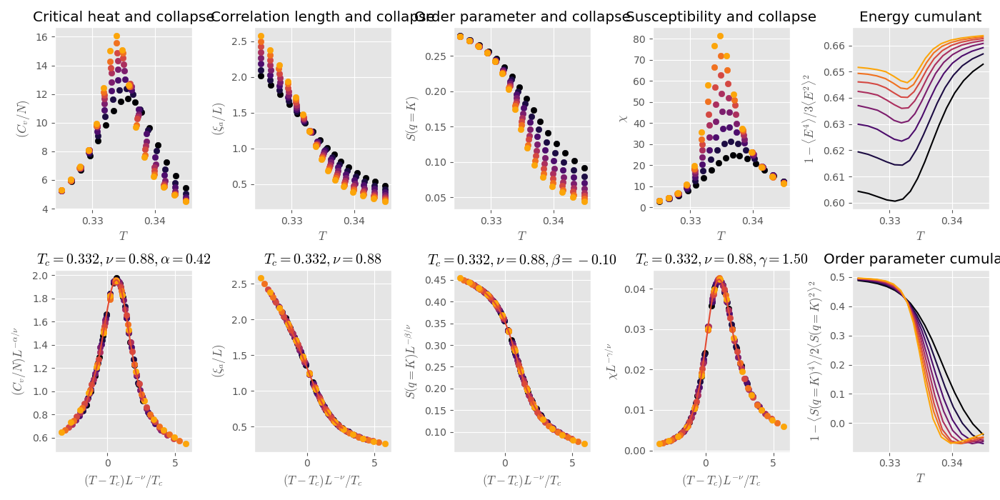

In [13]:
skip=50000
plot_all_collapse(
    [c for c in get_all_curves(["new-data/vsweeps/binder/1b/*/energy.dat"]) if c[0] > 36],
    [c for c in get_all_curves(["new-data/vsweeps/binder/1b/*/order.dat"], prop="corr") if c[0] > 36],
    [c for c in get_all_curves(["new-data/vsweeps/binder/1b/*/order.dat"], prop="k") if c[0] > 36],
    [c for c in get_all_curves(["new-data/vsweeps/binder/1b/*/order.dat"], prop="ksus") if c[0] > 36],
    [c for c in get_all_curves(["new-data/vsweeps/binder/1b/*/energy.dat"], prop="eb") if c[0] > 36],
    [c for c in get_all_curves(["new-data/vsweeps/binder/1b/*/order.dat"], prop="kb") if c[0] > 36],
    (0.33, 0.335),
    0.8806
)

In [18]:
curves = curves_from_moments(get_all_moments("new-data/vsweeps/binder-slp/1/*/histogram.dat", "new-data/binder-slp-1.pkl"))

plot_all_collapse(
    pick_curve(curves, "c"),
    None,
    pick_curve(curves, "s"),
    pick_curve(curves, "s_chi"),
    pick_curve(curves, "b_e"),
    pick_curve(curves, "b_s"),
    0.4617,
    (1, 1.2)
)

KeyError: 's_chi'

### 1.5

In [27]:
# curves = curves_from_moments(get_all_moments("new-data/vsweeps/binder-slp/1.5/*/histogram.dat", "new-data/binder-slp-1.5.pkl"))
curves = curves_from_moments(get_all_moments("new-data/vsweeps/binder-slp/1.5/*/histogram.dat", "new-data/binder-slp-1.5c.pkl"))

plot_all_collapse(
    pick_curve(curves, "cv", bounds=(0.5, 0.65)),
    None,
    pick_curve(curves, "s"),
    pick_curve(curves, "s_chi"),
    pick_curve(curves, "b_e"),
    pick_curve(curves, "b_s"),
    (0.5, 0.6),
    (0.9, 1.3),
    alpha_range=(0, 0.4)
)

KeyError: 's_chi'

[0.569      1.44797307 0.06979764 0.         0.         0.
 0.        ]
[ 0.569       1.05372136 -0.11840391  0.          0.          0.
  0.        ]
[0.569      1.11257204 1.80794406 0.         0.         0.
 0.        ]


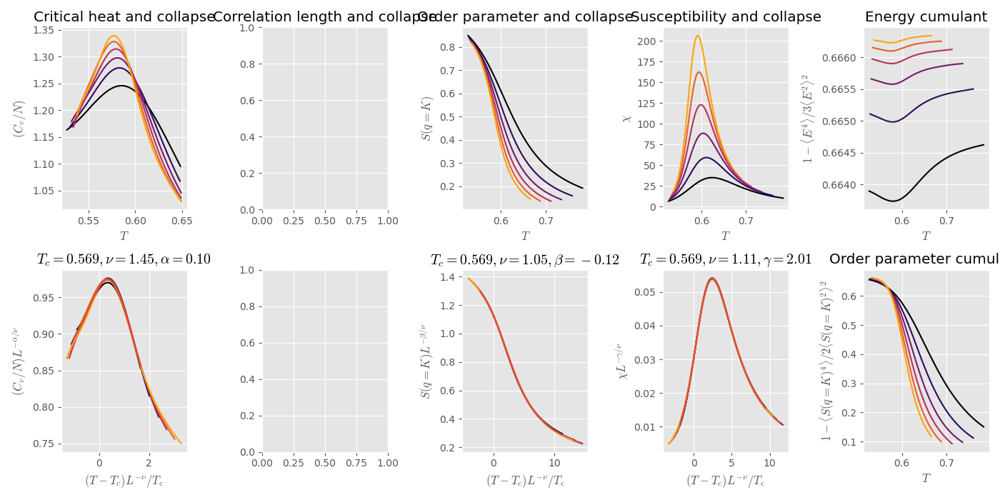

In [54]:
curves = curves_from_jsons("new-data/mhr/{}_slp_1.5.json", range(36, 96+1, 12))

plot_all_collapse(
    pick_curve(curves, "cv", bounds=(0.4, 0.65)),
    None,
    pick_curve(curves, "s"),
    pick_curve(curves, "chi_s"),
    pick_curve(curves, "b_e"),
    pick_curve(curves, "b_s"),
    0.569,
    (1, 2),
    alpha_range=(0, 0.4)
)

### 2

[0.33402    0.83       0.51132831 0.         0.         0.
 0.        ]
[0.33402 0.83    0.      0.      0.      0.      0.     ]
[ 0.33402     0.83       -0.12881909  0.          0.          0.
  0.        ]
[0.33402    0.83       1.73501155 0.         0.         0.
 0.        ]


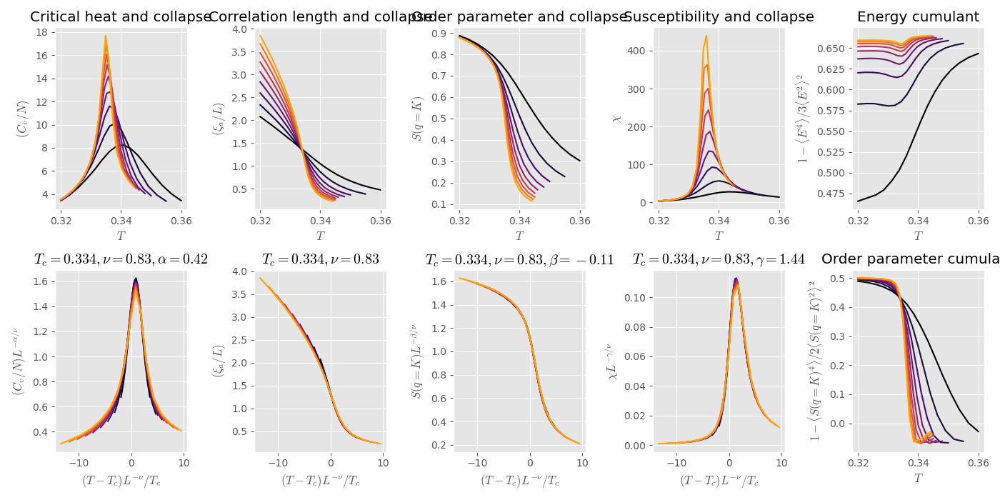

In [6]:
skip=50000
plot_all_collapse(
    [c for c in get_all_curves(["new-data/vsweeps/binder/2b/*/energy.dat"]) if c[0] > 0],
    [c for c in get_all_curves(["new-data/vsweeps/binder/2b/*/order.dat"], prop="corr") if c[0] > 0],
    [c for c in get_all_curves(["new-data/vsweeps/binder/2b/*/order.dat"], prop="k") if c[0] > 0],
    [c for c in get_all_curves(["new-data/vsweeps/binder/2b/*/order.dat"], prop="ksus") if c[0] > 0],
    [c for c in get_all_curves(["new-data/vsweeps/binder/2b/*/energy.dat"], prop="eb") if c[0] > 0],
    [c for c in get_all_curves(["new-data/vsweeps/binder/2b/*/order.dat"], prop="kb") if c[0] > 0],
    0.33402,
    0.83,
)

[0.33403    0.8897031  0.48924951 0.         0.         0.
 0.        ]
[ 0.33403     0.81735584 -0.12865388  0.          0.          0.
  0.        ]
[0.33403    0.84135795 1.73128279 0.         0.         0.
 0.        ]


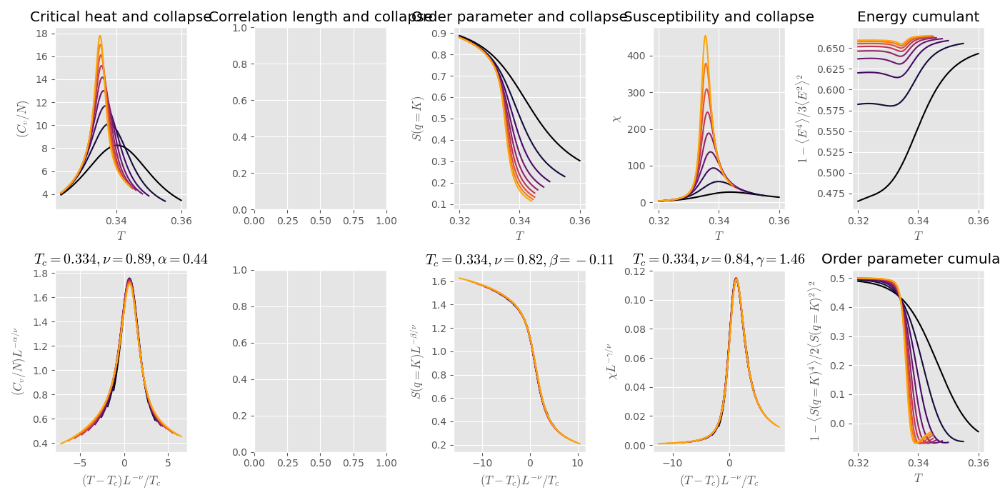

No such comm: 6bb78322bf864dacb40c2a285f7b6755


In [5]:
curves = curves_from_jsons("new-data/mhr/{}_2b.json", range(24, 120+1, 12))

plot_all_collapse(
    pick_curve(curves, "cv", bounds=(0.323, 0.36)),
    None,
    pick_curve(curves, "k"),
    pick_curve(curves, "chi_k"),
    pick_curve(curves, "b_e"),
    pick_curve(curves, "b_k"),
    0.33403,
    (0.8, 1.3),
    alpha_range=(0, 1.5)
)

[0.64326    1.2        0.06615293 0.         0.         0.
 0.        ]
[ 0.64326     1.09782827 -0.10755006  0.          0.          0.
  0.        ]
[0.64326    1.2        1.81639746 0.         0.         0.
 0.        ]


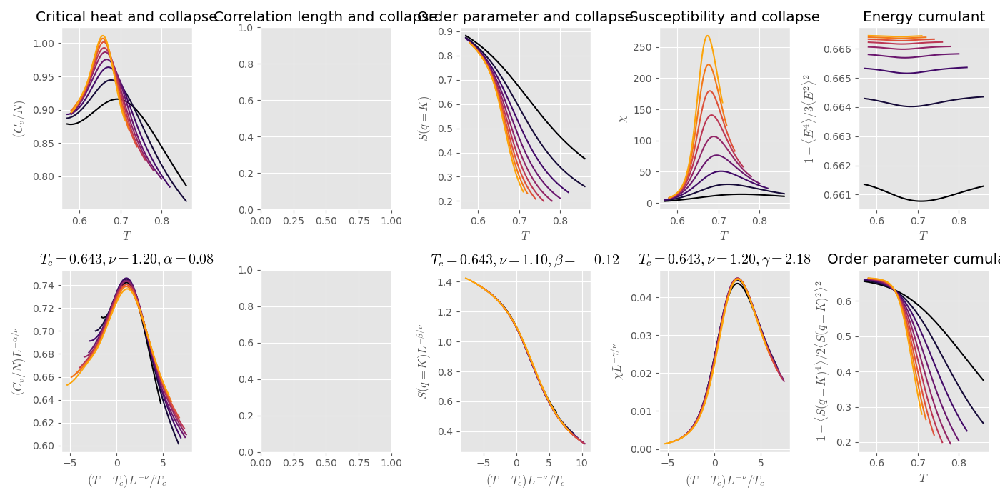

In [7]:
curves = curves_from_jsons("new-data/mhr/{}_slp_2b.json", range(24, 120+1, 12))

plot_all_collapse(
    pick_curve(curves, "cv", bounds=(0.5, 0.9)),
    None,
    pick_curve(curves, "s"),
    pick_curve(curves, "chi_s"),
    pick_curve(curves, "b_e"),
    pick_curve(curves, "b_s"),
    0.64326,
    (0.9, 1.2),
    alpha_range=(0, 0.4)
)